<a href="https://www.kaggle.com/code/gcuber/vehicle-detection-by-fine-tuning-fasterrcnn?scriptVersionId=179156542" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import torch
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torch.utils.data import Dataset, DataLoader, Subset
import torchvision.transforms.functional as F

import numpy as np
import matplotlib.pyplot as plt
import cv2
import random

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

## 1. Inference on an image using Pre-trained Model

Using faster rcnn model with resnet50 to detect objects on an image.

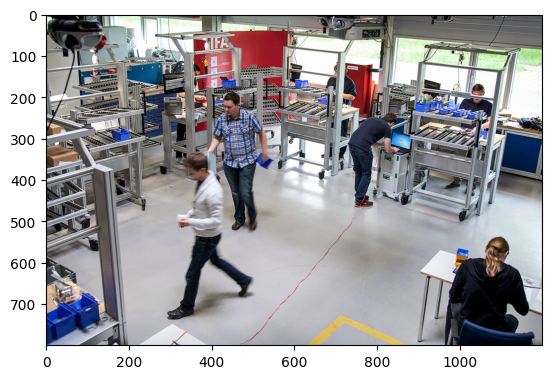

In [3]:
!wget https://www.uni-hannover.de/fileadmin/luh/studiengaenge/Produktion_und_Logistik_Master/produktion_und_logistik_master.jpg -q -O input.jpg
img = cv2.imread("./input.jpg")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [4]:
def img_transform(img):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
  img /= 255.0
  img = torch.from_numpy(img).permute(2,0,1)
  return img

In [5]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights='COCO_V1').to(device)
model

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 166MB/s]


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [6]:
def inference(img, model, detection_threshold=0.70):

  model.eval()

  img = img.to(device)
  outputs = model([img])

  boxes = outputs[0]['boxes'].data.cpu().numpy()
  scores = outputs[0]['scores'].data.cpu().numpy()
  labels = outputs[0]['labels'].data.cpu().numpy()

  boxes = boxes[scores >= detection_threshold].astype(np.int32)
  labels = labels[scores >= detection_threshold]
  scores = scores[scores >= detection_threshold]

  return boxes, scores, labels

In [7]:
import matplotlib.patches as patches

def plot_image(img, boxes, scores, labels, dataset, save_path=None):

  cmap = plt.get_cmap("tab20b")
  class_labels = np.array(dataset)
  colors = [cmap(i) for i in np.linspace(0, 1, len(class_labels))]
  height, width, _ = img.shape

  fig, ax = plt.subplots(1, figsize=(16, 8))

  ax.imshow(img)
  for i, box in enumerate(boxes):
    class_pred = labels[i]
    conf = scores[i]
    width = box[2] - box[0]
    height = box[3] - box[1]
    rect = patches.Rectangle(
        (box[0], box[1]),
        width,
        height,
        linewidth=2,
        edgecolor=colors[int(class_pred)],
        facecolor="none",
    )

    ax.add_patch(rect)
    plt.text(
        box[0], box[1],
        s=class_labels[int(class_pred)] + " " + str(int(100*conf)) + "%",
        color="white",
        verticalalignment="top",
        bbox={"color": colors[int(class_pred)], "pad": 0},
    )

  if save_path is not None:
    plt.savefig(save_path)

  plt.show()

In [8]:
img = img_transform(img)
boxes, scores, labels = inference(img, model)

In [9]:
boxes, scores, labels

(array([[ 729,  238,  856,  474],
        [ 290,  337,  500,  736],
        [ 373,  183,  539,  528],
        [ 972,  541, 1171,  775],
        [ 994,  728, 1180,  798],
        [ 832,  283,  885,  342],
        [ 994,  169, 1079,  257],
        [ 672,  120,  754,  311],
        [ 898,  562, 1016,  783]], dtype=int32),
 array([0.99954164, 0.99904126, 0.99879575, 0.996935  , 0.9691079 ,
        0.9441956 , 0.935119  , 0.90730256, 0.8569113 ], dtype=float32),
 array([ 1,  1,  1,  1, 62, 72,  1,  1, 67]))

In [10]:
with open("/kaggle/input/coco-labels-txt/coco_labels.txt", "r") as coco:
  COCO_LABELS = coco.readlines()

for i, _ in enumerate(COCO_LABELS):
  COCO_LABELS[i] = COCO_LABELS[i].replace("\n", "")

In [11]:
COCO_LABELS

['background',
 'person',
 'bicycle',
 'car',
 'motorcycle',
 'airplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'street sign',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'hat',
 'backpack',
 'umbrella',
 'shoe',
 'eye glasses',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'plate',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'couch',
 'potted plant',
 'bed',
 'mirror',
 'dining table',
 'window',
 'desk',
 'toilet',
 'door',
 'tv',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'blender',
 'book',
 'clock',


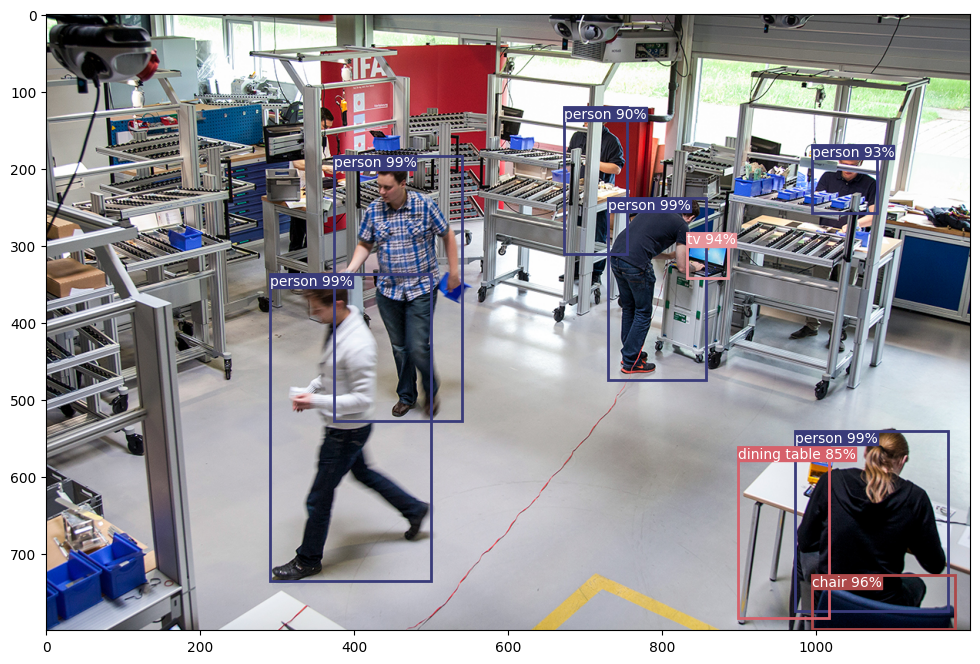

In [12]:
img = img.cpu().permute(1,2,0).numpy()
plot_image(img, boxes, scores, labels, COCO_LABELS)

##2. Fine-tuning the pre-trained model with new data.

In [13]:
!wget -nc https://s3.amazonaws.com/udacity-sdc/annotations/object-detection-crowdai.tar.gz
!tar xf object-detection-crowdai.tar.gz

--2024-05-22 15:57:31--  https://s3.amazonaws.com/udacity-sdc/annotations/object-detection-crowdai.tar.gz
Resolving s3.amazonaws.com (s3.amazonaws.com)... 16.182.69.128, 54.231.236.96, 52.216.61.112, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|16.182.69.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1650810880 (1.5G) [application/x-gzip]
Saving to: 'object-detection-crowdai.tar.gz'

object-detection-cr 100%[===================>]   1.54G  66.7MB/s    in 28s     

2024-05-22 15:57:59 (56.6 MB/s) - 'object-detection-crowdai.tar.gz' saved [1650810880/1650810880]



In [14]:
import pandas as pd
!wget https://raw.githubusercontent.com/udacity/self-driving-car/master/annotations/labels_crowdai.csv -q -O labels_crowdai.csv

In [15]:
df = pd.read_csv('labels_crowdai.csv')

In [16]:
path_csv = 'labels_crowdai.csv'
img_dir = 'object-detection-crowdai/'

In [17]:
import glob
import os
df = pd.read_csv(path_csv)
print("Number of total bounding boxes: ", len(df))

image_paths = glob.glob(f"{img_dir}/*.jpg")
all_images = [image_path.split(os.path.sep)[-1] for image_path in image_paths]
all_images = sorted(all_images)
print("Number of unique images: ", len(all_images))

Number of total bounding boxes:  72064
Number of unique images:  9420


In [18]:
'''
Class that holds all the augmentation related attributes
'''
class Transformation():
    # This provides a random probability of the augmentation to be applied or not
    def get_probability(self):
        return np.random.choice([False, True], replace=False, p=[0.5, 0.5])

    # Increases the contrast by a factor of 2
    def random_adjust_contrast(self, image, enable=None):
        enable = self.get_probability() if enable is None else enable
        return F.adjust_contrast(image, 2) if enable else image

    # Increaes the brightness by a factor of 2
    def random_adjust_brightness(self, image, enable=None):
        enable = enable = self.get_probability() if enable is None else enable
        return F.adjust_brightness(image,2) if enable else image

    # Horizontal flip
    def random_hflip(self, image, boxes, enable=None):
        enable = enable = self.get_probability() if enable is None else enable
        if enable:
          #flip image
          new_image = F.hflip(image)

          #flip boxes
          new_boxes = boxes.clone()
          new_boxes[:, 0] = image.shape[2] - boxes[:, 0]  # image width - xmin
          new_boxes[:, 2] = image.shape[2] - boxes[:, 2]  # image_width - xmax
          new_boxes = new_boxes[:, [2, 1, 0, 3]]          # Interchange the xmin and xmax due to mirroring
          return new_image, new_boxes
        else:
          return image, boxes

In [19]:
class vehicleDataset(Dataset):
  def __init__(self, img_path, label_path, classes, transforms=None):
    super().__init__()
    print("Preparing the dataset...")

    self.image_dir = img_path
    self.gt_info = pd.read_csv(label_path)
    self.classes = classes
    self.transforms = transforms

    self.image_paths = glob.glob(f"{img_path}/*.jpg")
    all_images = [image_path.split(os.path.sep)[-1] for image_path in self.image_paths]
    self.all_images = sorted(all_images)

    for i in range(len(self.gt_info)):
      label = self.gt_info.loc[i, 'Label']
      self.gt_info.loc[i, 'Label'] = self.classes.index(label)

    self.filter_dataset()
    print("Dataset prepared")

  def __getitem__(self, idx):
    target = {}

    image_name = self.all_images[idx]
    image_path = os.path.join(self.image_dir, image_name)
    image = cv2.imread(image_path)
    image = img_transform(image)

    gt_info = self.gt_info[self.gt_info['Frame'] == image_name]

    boxes = torch.Tensor(gt_info[['xmin', 'ymin', 'xmax', 'ymax']].values).float()
    labels = torch.LongTensor(gt_info['Label'].values.tolist())

    if self.transforms:
        image = self.transforms.random_adjust_contrast(image, enable=True)
        image = self.transforms.random_adjust_brightness(image, enable=True)
        image, boxes = self.transforms.random_hflip(image, boxes, enable=True)

    target["boxes"] = boxes
    target["labels"] = labels

    return image, target

  def __len__(self):
    return len(self.all_images)

  '''
  Filter the dataset by removing images with no labels and incorrect bounding boxes
  '''
  def filter_dataset(self):
    print("Filtering the dataset...")
    remove_images = []

    # There are no labels for some images because they show an 'empty' scene → these images should be filtered out.
    for image_file in self.all_images.copy():
      if image_file not in self.gt_info['Frame'].values:
        remove_images.append(image_file)
        self.all_images.remove(image_file)
    print("Images removed with no labels: ", len(remove_images))

    # There are incorrect bounding boxes in the dataset (e.g. xmax=xmin).
    valid_box_mask = (self.gt_info['xmax'] - self.gt_info['xmin'] > 0) & (self.gt_info['ymax'] - self.gt_info['ymin'] > 0)
    print("Images removed with incorrect bounding boxes: ", len(self.gt_info) - valid_box_mask.shape[0])
    self.gt_info = self.gt_info[valid_box_mask]

Testing the created dataset class by running an infernce on random images of the dataset.

Preparing the dataset...
Filtering the dataset...
Images removed with no labels:  202
Images removed with incorrect bounding boxes:  0
Dataset prepared
Image index:  5051


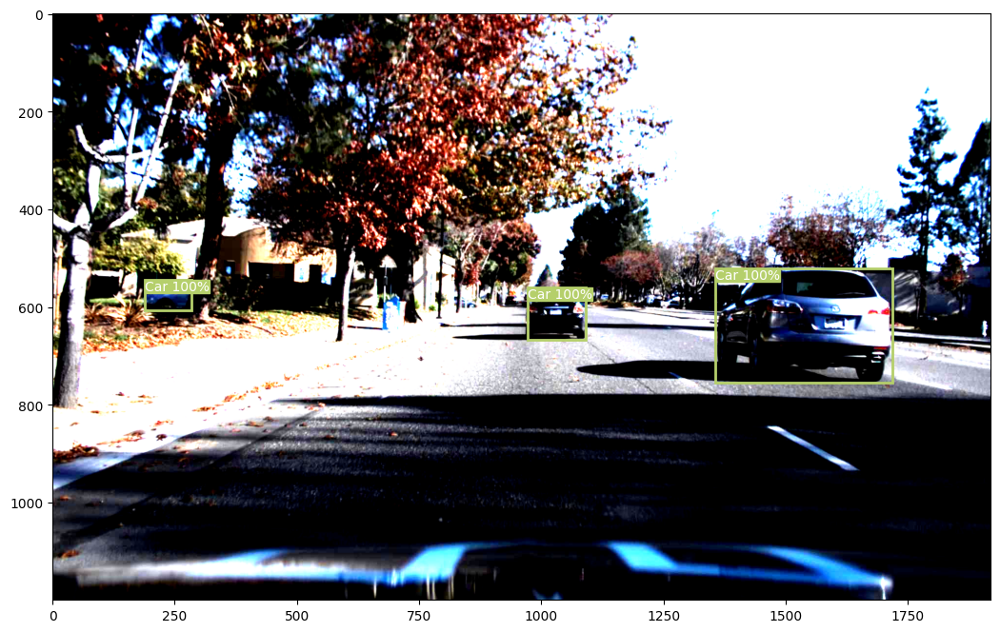

Image index:  2337


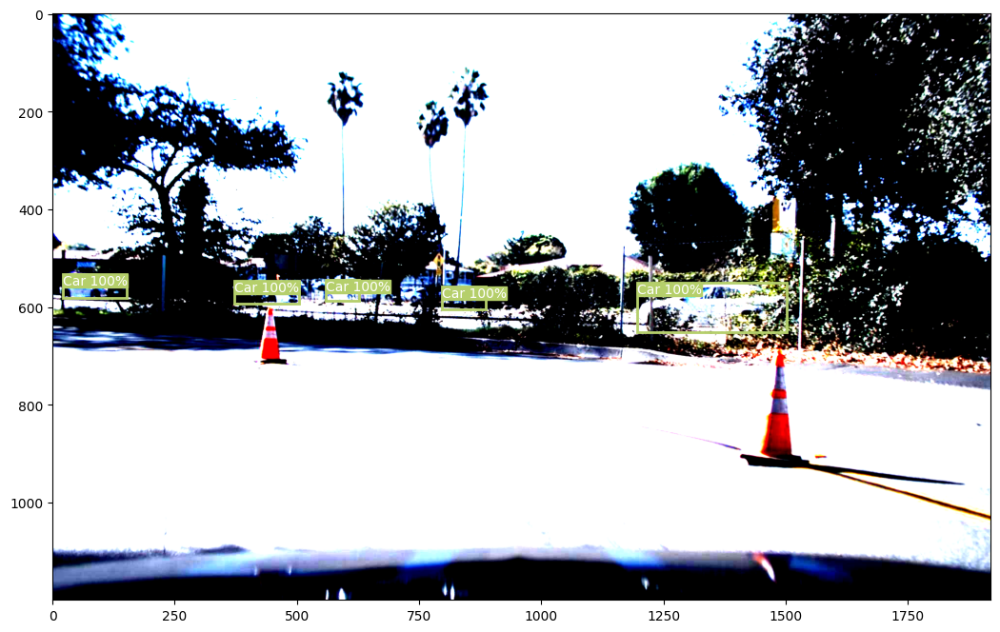

Image index:  22


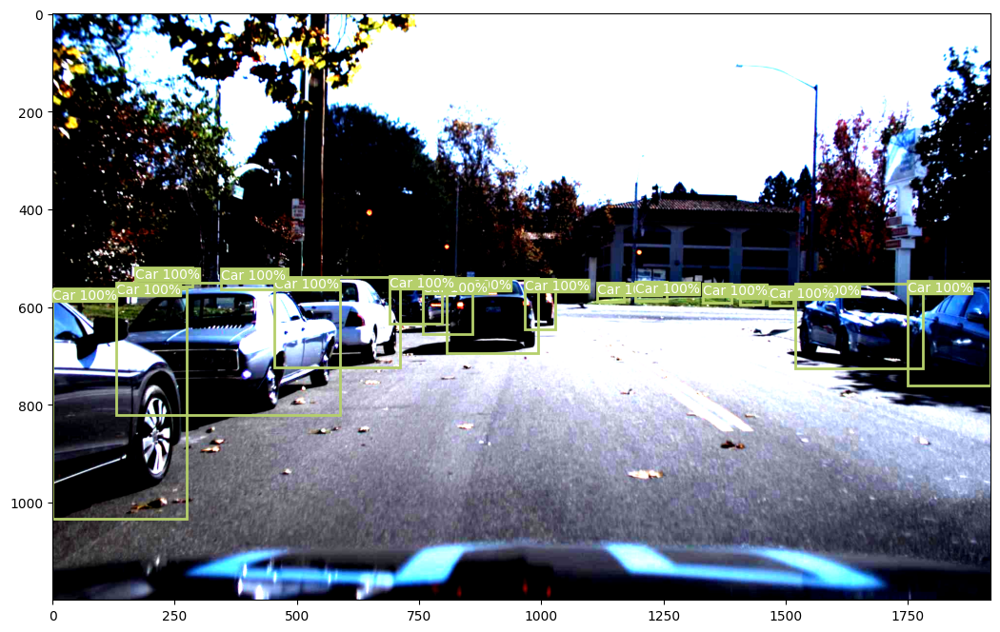

Image index:  6214


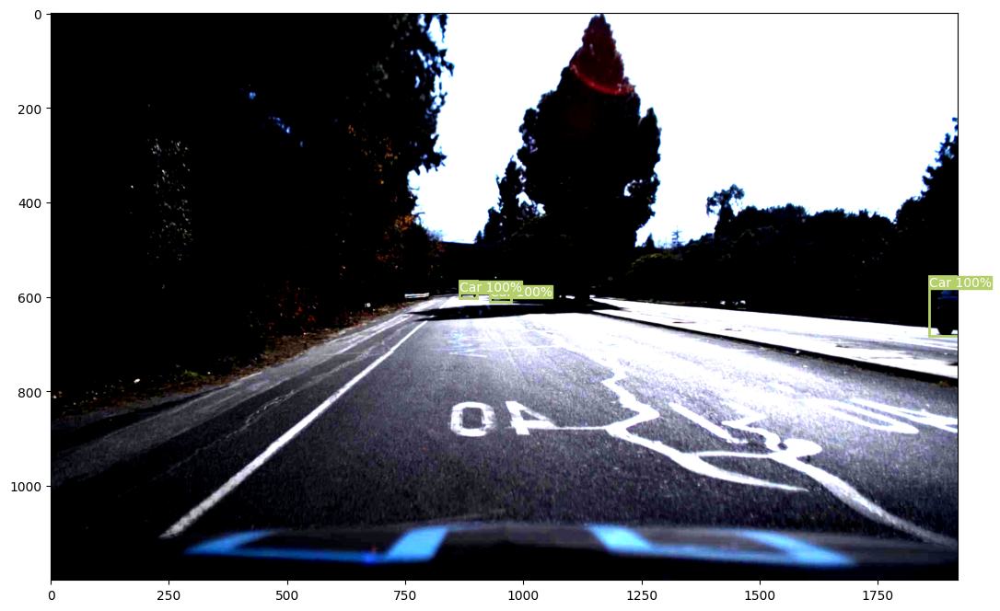

Image index:  303


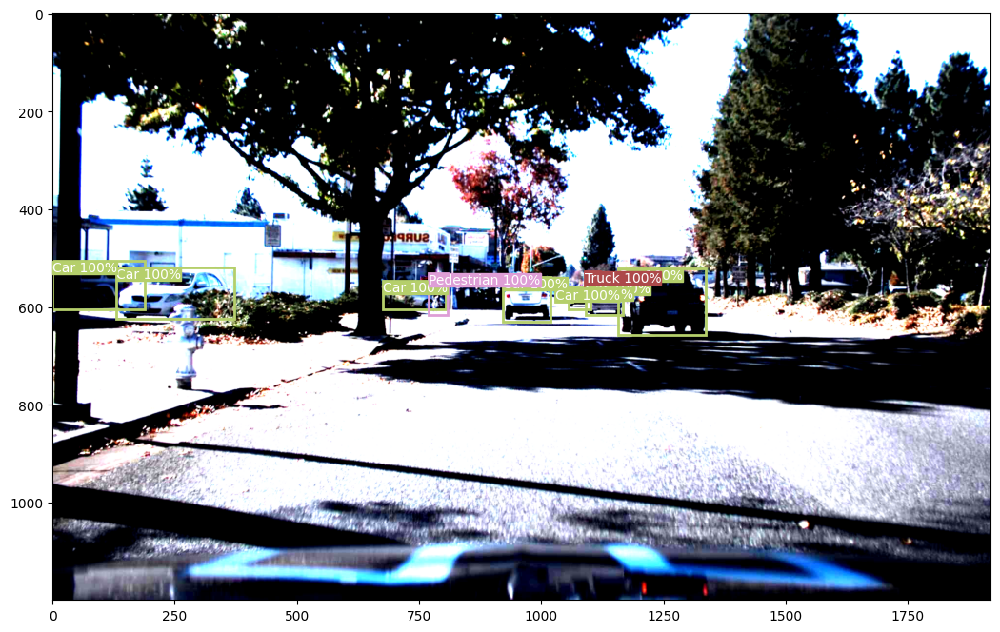

In [20]:
crowdai = ["Background", "Car", "Truck", "Pedestrian"]
dataset = vehicleDataset(img_dir, path_csv, crowdai, transforms=Transformation())
num_images = 5

for _ in range(num_images):
  x = random.randint(0, (dataset.__len__()-1))
  img, target = dataset.__getitem__(x)
  img = img.cpu().permute(1,2,0).numpy()
  boxes = target['boxes'].numpy()
  labels = target['labels'].numpy()
  scores = [1]*len(labels)
  print("Image index: ", x)
  plot_image(img, boxes, scores, labels, crowdai)

## FINE-TUNE

In [21]:
# Hyperparameters

SEED = 42

TEST_SIZE = 0.2

NUM_EPOCHS = 5

LR = 0.005
LR_MOMENTUM=0.9
LR_DECAY_RATE=0.0005

LR_SCHED_STEP_SIZE = 0.1
LR_SCHED_GAMMA = 0.1

BATCH_SIZE = 16

NUM_TEST_IMAGES = 5
NMS_THRESH = 0.01

In [22]:
current_dir = os.getcwd()
from datetime import datetime
# Fetch current date and time
now = datetime.now()
dt_string = now.strftime("%d-%m-%Y-%H-%M-%S")
output_dir_name = "output-" + dt_string

OUTPUT_DIR = os.path.join(current_dir, output_dir_name)
os.makedirs(OUTPUT_DIR, exist_ok=True)

In [23]:
crowdai = ["Background", "Car", "Truck", "Pedestrian"]

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(min_size=300, max_size=480, pretrained=True)
num_classes = 4  # 3 classes + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
model.to(device)

num_epochs = NUM_EPOCHS

# optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=LR, momentum=LR_MOMENTUM, weight_decay=LR_DECAY_RATE)


dataset = vehicleDataset(img_dir, path_csv, crowdai, transforms=Transformation())
dataset_test = vehicleDataset(img_dir, path_csv, crowdai, transforms=None)

torch.manual_seed(SEED)
indices = torch.randperm(len(dataset)).tolist()

test_size = int(len(dataset) * TEST_SIZE)
dataset = torch.utils.data.Subset(dataset, indices[:-test_size])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-test_size:])

# create a learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, \
                                                step_size=LR_SCHED_STEP_SIZE, \
                                                gamma=LR_SCHED_GAMMA)

def collate_fn(batch):
  return tuple(zip(*batch))

data_loader = torch.utils.data.DataLoader(
  dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2,
  collate_fn=collate_fn)

data_loader_test = torch.utils.data.DataLoader(
  dataset_test, batch_size=1, shuffle=False, num_workers=2,
  collate_fn=collate_fn)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Preparing the dataset...
Filtering the dataset...
Images removed with no labels:  202
Images removed with incorrect bounding boxes:  0
Dataset prepared
Preparing the dataset...
Filtering the dataset...
Images removed with no labels:  202
Images removed with incorrect bounding boxes:  0
Dataset prepared


In [24]:
def train_one_epoch(model, optimizer, data_loader, device, epoch):
  train_loss_list = []

  tqdm_bar = tqdm(data_loader, total=len(data_loader))
  for idx, data in enumerate(tqdm_bar):
    optimizer.zero_grad()
    images, targets = data

    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]  # targets = {'boxes'=tensor, 'labels'=tensor}

    losses = model(images, targets)

    loss = sum(loss for loss in losses.values())
    loss_val = loss.item()
    train_loss_list.append(loss.detach().cpu().numpy())

    loss.backward()
    optimizer.step()

    tqdm_bar.set_description(desc=f"Training Loss: {loss:.3f}")

  return train_loss_list

In [25]:
def evaluate(model, data_loader_test, device):
    val_loss_list = []

    tqdm_bar = tqdm(data_loader_test, total=len(data_loader_test))

    for i, data in enumerate(tqdm_bar):
        images, targets = data

        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            losses = model(images, targets)

        loss = sum(loss for loss in losses.values())
        loss_val = loss.item()
        val_loss_list.append(loss_val)

        tqdm_bar.set_description(desc=f"Validation Loss: {loss:.4f}")
    return val_loss_list

In [26]:
def plot_loss(train_loss, valid_loss):
    figure_1, train_ax = plt.subplots()
    figure_2, valid_ax = plt.subplots()

    train_ax.plot(train_loss, color='blue')
    train_ax.set_xlabel('Iteration')
    train_ax.set_ylabel('Training Loss')

    valid_ax.plot(valid_loss, color='red')
    valid_ax.set_xlabel('Iteration')
    valid_ax.set_ylabel('Validation loss')

    figure_1.savefig(f"{OUTPUT_DIR}/train_loss.png")
    figure_2.savefig(f"{OUTPUT_DIR}/valid_loss.png")

In [27]:
# find latest saved chcekpoint
checkpoint_files = [f for f in os.listdir(OUTPUT_DIR) if f.endswith('.pth')]
if checkpoint_files:
    # Last ckpt file
    checkpoint_files.sort()
    latest_checkpoint = os.path.join(OUTPUT_DIR, checkpoint_files[-1])

    # Load the ckpt
    checkpoint = torch.load(latest_checkpoint)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    start_epoch = checkpoint['epoch']
    loss_dict = checkpoint['loss_dict']
else:
    start_epoch = 0
    loss_dict = {'train_loss': [], 'valid_loss': []}

----------Epoch 1----------


Validation Loss: 0.9920: 100%|██████████| 1843/1843 [01:49<00:00, 16.79it/s]


----------Epoch 2----------


Validation Loss: 1.0287: 100%|██████████| 1843/1843 [01:48<00:00, 16.97it/s]


----------Epoch 3----------


Validation Loss: 1.0595: 100%|██████████| 1843/1843 [01:50<00:00, 16.73it/s]


----------Epoch 4----------


Validation Loss: 1.1170: 100%|██████████| 1843/1843 [01:49<00:00, 16.79it/s]


----------Epoch 5----------


Validation Loss: 1.0446: 100%|██████████| 1843/1843 [01:51<00:00, 16.53it/s]


Training Finished !


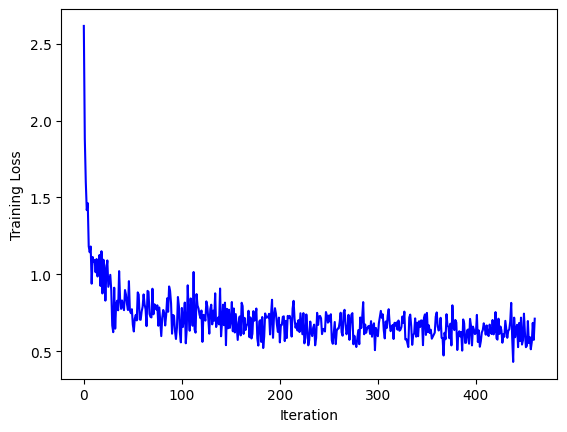

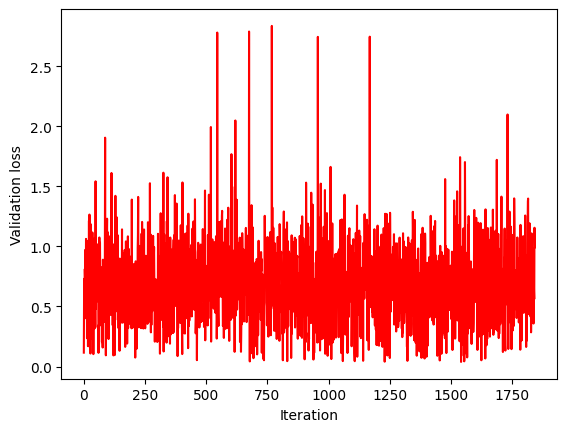

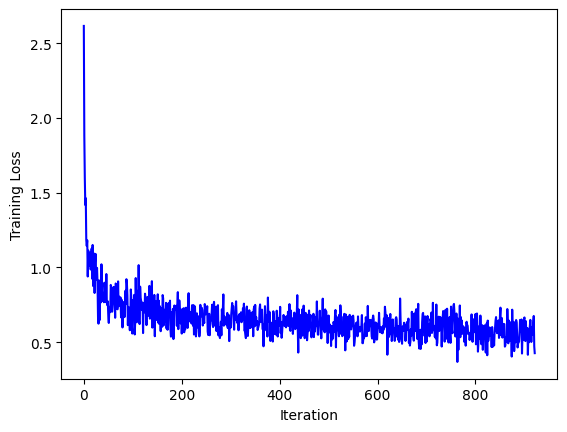

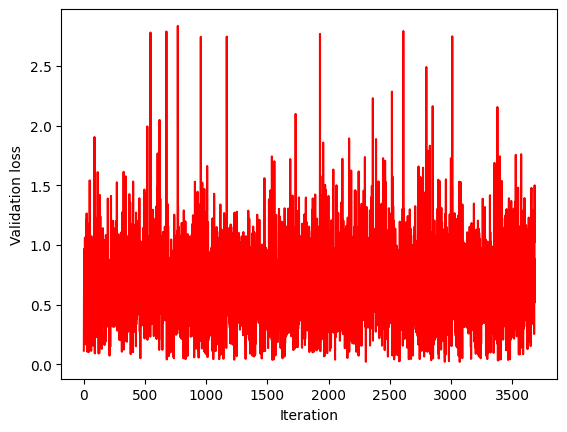

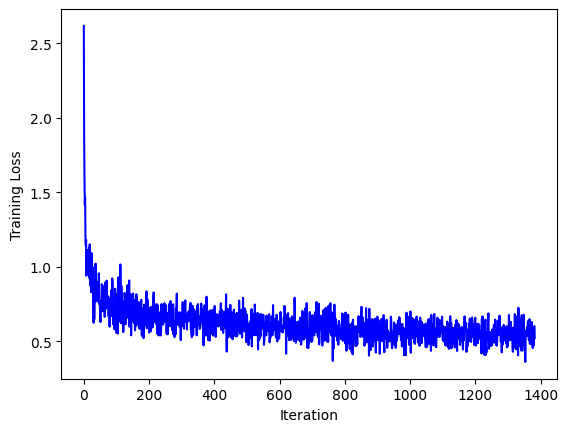

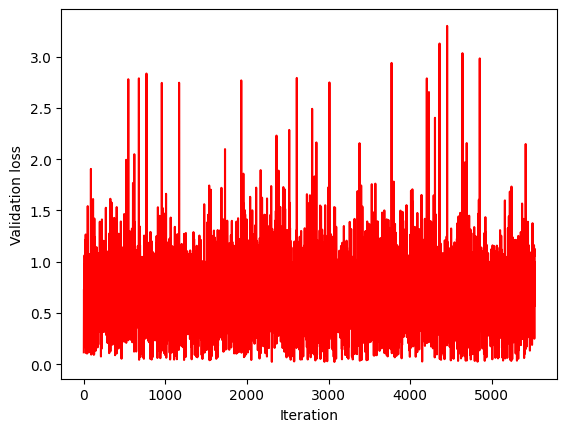

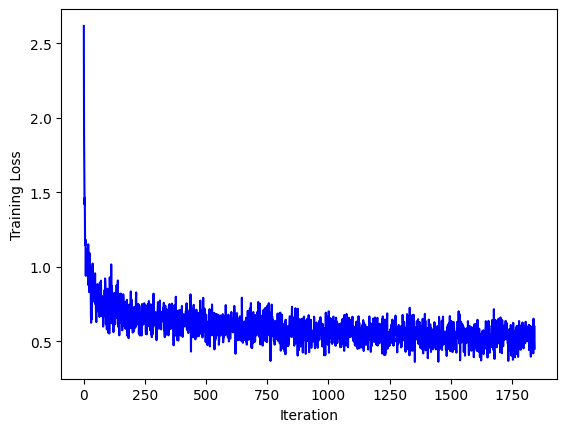

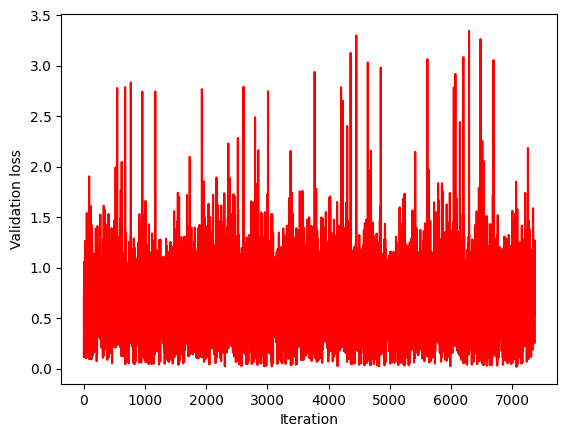

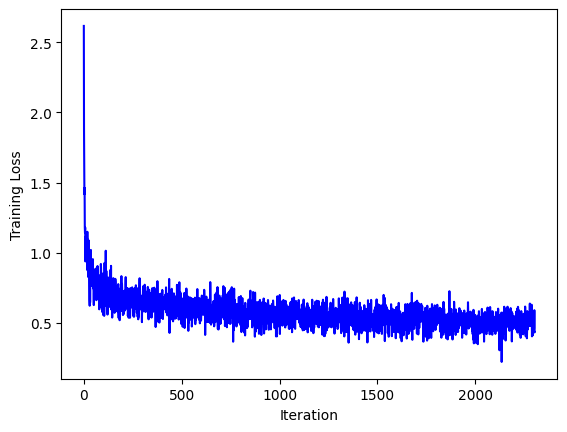

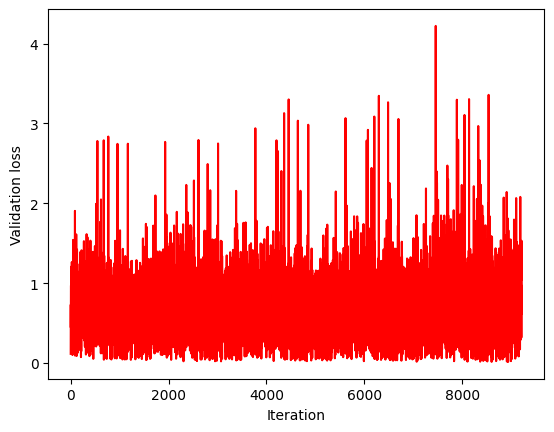

In [28]:
# Training
from tqdm import tqdm
import pickle

for epoch in range(start_epoch, num_epochs):
  print("----------Epoch {}----------".format(epoch+1))

  train_loss_list = train_one_epoch(model, optimizer, data_loader, device, epoch)
  loss_dict['train_loss'].extend(train_loss_list)

  lr_scheduler.step()

  valid_loss_list = evaluate(model, data_loader_test, device)
  loss_dict['valid_loss'].extend(valid_loss_list)

  # Svae the model ckpt after every epoch
  ckpt_file_name = f"{OUTPUT_DIR}/epoch_{epoch+1}_model.pth"
  torch.save({
    'epoch': epoch+1,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss_dict': loss_dict
  }, ckpt_file_name)

  # NOTE: The losses are accumulated over all iterations
  plot_loss(loss_dict['train_loss'], loss_dict['valid_loss'])

# Store the losses after the training in a pickle
with open(f"{OUTPUT_DIR}/loss_dict.pkl", "wb") as file:
    pickle.dump(loss_dict, file)

print("Training Finished !")

## Testing the model

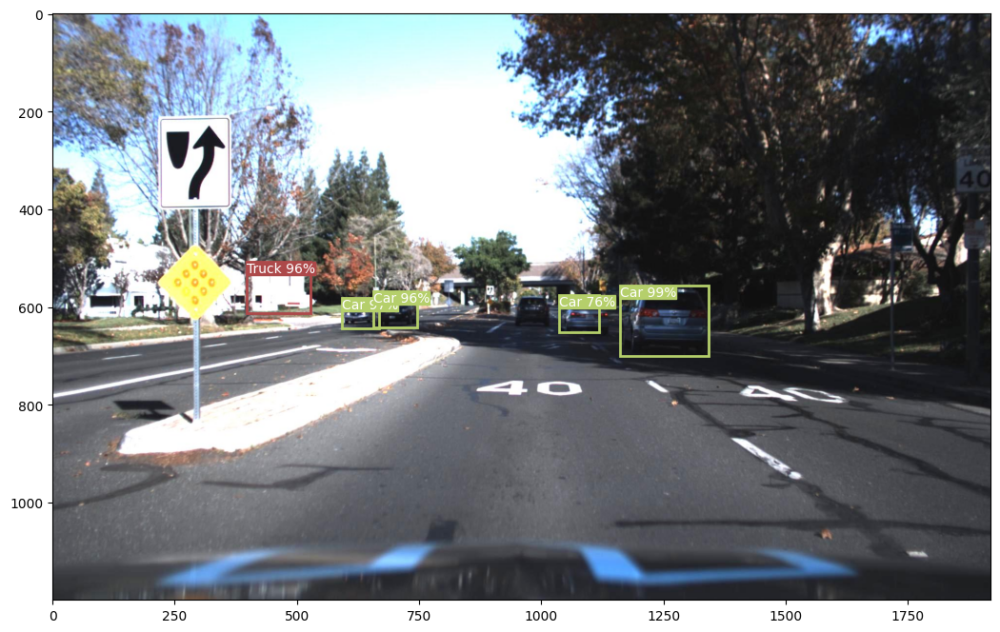

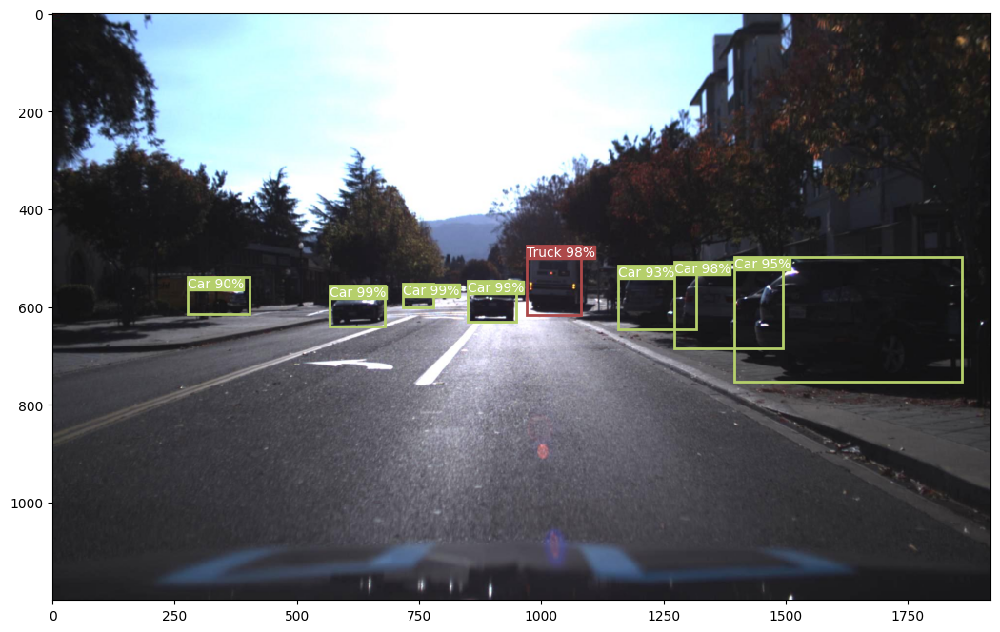

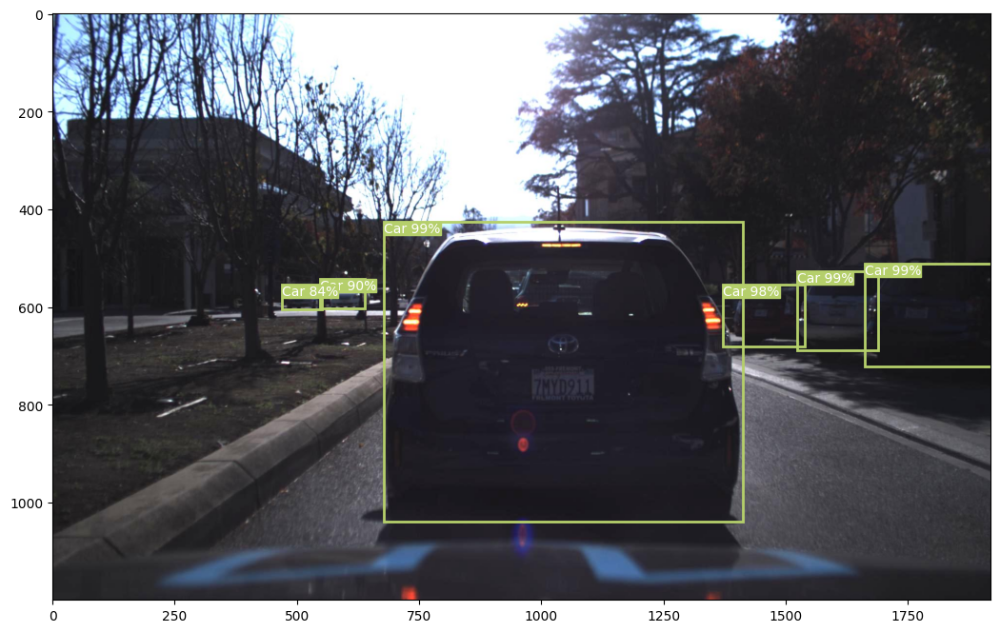

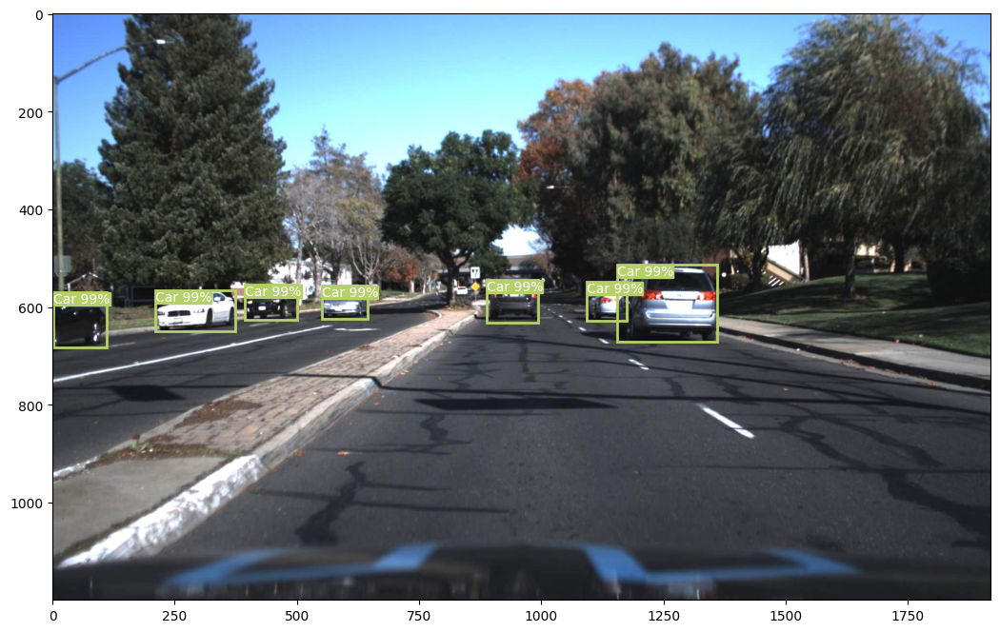

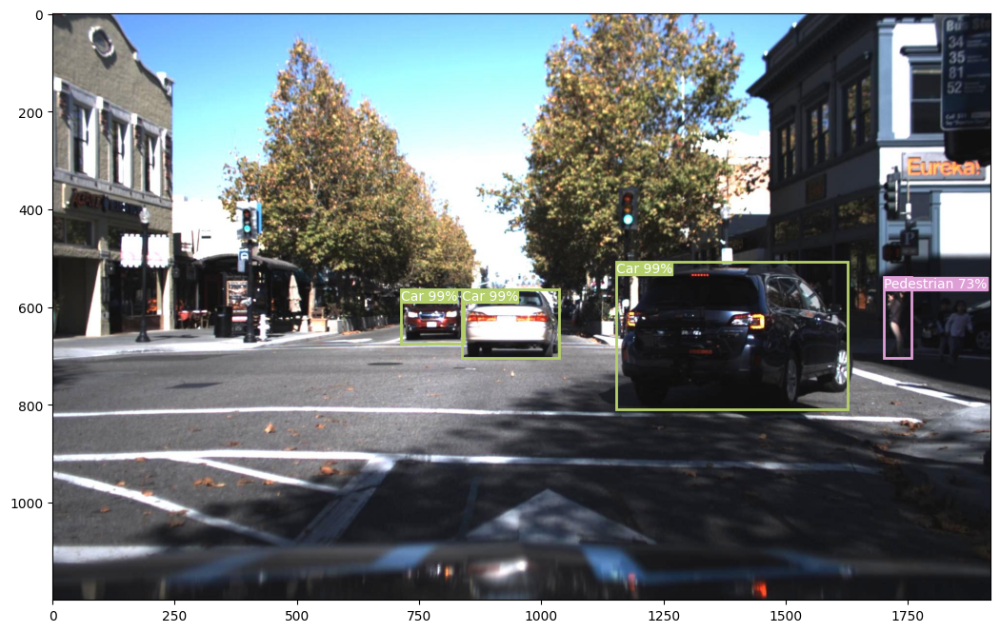

In [29]:
random.seed(SEED)
crowdai = ["Background", "Car", "Truck", "Pedestrian"]
num_images = NUM_TEST_IMAGES

for _ in range(num_images):
  x = random.randint(0, (dataset_test.__len__()-1))
  img, target = dataset_test.__getitem__(x)
  img = img.to(device)

  # Load last checkpoint
  # CHANGE THE OUTPUT_DIR IF CKPT IS STORED ELSEWHERE
  checkpoint_dir = f"/{OUTPUT_DIR}/epoch_5_model.pth"
  checkpoint = torch.load(checkpoint_dir, map_location=device)
  model.load_state_dict(checkpoint['model_state_dict'])

  boxes, scores, labels = inference(img, model)

  img = img.squeeze(0).cpu().permute(1,2,0).numpy()
  plot_image(img, boxes, scores, labels, crowdai, save_path=f"{OUTPUT_DIR}/inference_{x}.png")